## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook.

In [1]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [3]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [4]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [5]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [21]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos
0,2020-01-01,1.289946
1,2020-01-02,0.735046
2,2020-01-03,0.591834
3,2020-01-04,1.367154
4,2020-01-05,1.505321
...,...,...
913,2022-07-02,0.778572
914,2022-07-03,0.819483
915,2022-07-04,0.843804
916,2022-07-05,0.850985


---

## Desarrollo del modelo

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
   
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

[0]	validation_0-rmse:1.00400	validation_1-rmse:0.99153
[1]	validation_0-rmse:0.90878	validation_1-rmse:0.98571
[2]	validation_0-rmse:0.84297	validation_1-rmse:0.98957
[3]	validation_0-rmse:0.79791	validation_1-rmse:1.00012
[4]	validation_0-rmse:0.76092	validation_1-rmse:1.01715
[5]	validation_0-rmse:0.73906	validation_1-rmse:1.02397
[6]	validation_0-rmse:0.71643	validation_1-rmse:1.03161
[7]	validation_0-rmse:0.68232	validation_1-rmse:1.04224
[8]	validation_0-rmse:0.66759	validation_1-rmse:1.04720
[9]	validation_0-rmse:0.65516	validation_1-rmse:1.05400
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.2905261052771817
MAE is : 0.9110734788964069
RMSE is : 1.136013250484862
MAPE is : 50.015802537792574
Evaluation metric results:
MSE is : 1.513875299957496
MAE is : 0.9965569635408122
RMSE is : 1.230396399522323
MAPE is : 52.96658804352757
[0]	validation_0-rmse:1.00400	validation_1-rmse:0.99153
[1]	validation_0-rmse:0.90878	validation_1-rmse:0.98571
[2]	val

[23]	validation_0-rmse:0.48908	validation_1-rmse:1.07064
[24]	validation_0-rmse:0.48011	validation_1-rmse:1.07528
[25]	validation_0-rmse:0.47263	validation_1-rmse:1.07559
[26]	validation_0-rmse:0.46060	validation_1-rmse:1.07847
[27]	validation_0-rmse:0.45211	validation_1-rmse:1.07905
[28]	validation_0-rmse:0.44651	validation_1-rmse:1.07974
[29]	validation_0-rmse:0.43994	validation_1-rmse:1.07840
[30]	validation_0-rmse:0.43076	validation_1-rmse:1.07948
[31]	validation_0-rmse:0.41669	validation_1-rmse:1.08118
[32]	validation_0-rmse:0.39933	validation_1-rmse:1.08158
[33]	validation_0-rmse:0.39610	validation_1-rmse:1.08170
[34]	validation_0-rmse:0.38524	validation_1-rmse:1.08375
[35]	validation_0-rmse:0.37109	validation_1-rmse:1.08473
[36]	validation_0-rmse:0.36489	validation_1-rmse:1.08456
[37]	validation_0-rmse:0.36176	validation_1-rmse:1.08470
[38]	validation_0-rmse:0.35793	validation_1-rmse:1.08528
[39]	validation_0-rmse:0.35136	validation_1-rmse:1.08801
[40]	validation_0-rmse:0.34001	

[46]	validation_0-rmse:0.30883	validation_1-rmse:1.08989
[47]	validation_0-rmse:0.30087	validation_1-rmse:1.08900
[48]	validation_0-rmse:0.29755	validation_1-rmse:1.08982
[49]	validation_0-rmse:0.29240	validation_1-rmse:1.09101
[50]	validation_0-rmse:0.28831	validation_1-rmse:1.09147
[51]	validation_0-rmse:0.28297	validation_1-rmse:1.09114
[52]	validation_0-rmse:0.27712	validation_1-rmse:1.09296
[53]	validation_0-rmse:0.26742	validation_1-rmse:1.09280
[54]	validation_0-rmse:0.26228	validation_1-rmse:1.09358
[55]	validation_0-rmse:0.25934	validation_1-rmse:1.09337
[56]	validation_0-rmse:0.25244	validation_1-rmse:1.09314
[57]	validation_0-rmse:0.24877	validation_1-rmse:1.09423
[58]	validation_0-rmse:0.24190	validation_1-rmse:1.09395
[59]	validation_0-rmse:0.24010	validation_1-rmse:1.09378
[60]	validation_0-rmse:0.23396	validation_1-rmse:1.09629
[61]	validation_0-rmse:0.23107	validation_1-rmse:1.09567
[62]	validation_0-rmse:0.22827	validation_1-rmse:1.09511
[63]	validation_0-rmse:0.22183	

[29]	validation_0-rmse:0.43994	validation_1-rmse:1.07840
[30]	validation_0-rmse:0.43076	validation_1-rmse:1.07948
[31]	validation_0-rmse:0.41669	validation_1-rmse:1.08118
[32]	validation_0-rmse:0.39933	validation_1-rmse:1.08158
[33]	validation_0-rmse:0.39610	validation_1-rmse:1.08170
[34]	validation_0-rmse:0.38524	validation_1-rmse:1.08375
[35]	validation_0-rmse:0.37109	validation_1-rmse:1.08473
[36]	validation_0-rmse:0.36489	validation_1-rmse:1.08456
[37]	validation_0-rmse:0.36176	validation_1-rmse:1.08470
[38]	validation_0-rmse:0.35793	validation_1-rmse:1.08528
[39]	validation_0-rmse:0.35136	validation_1-rmse:1.08801
[40]	validation_0-rmse:0.34001	validation_1-rmse:1.08781
[41]	validation_0-rmse:0.33875	validation_1-rmse:1.08615
[42]	validation_0-rmse:0.33309	validation_1-rmse:1.08568
[43]	validation_0-rmse:0.33125	validation_1-rmse:1.08549
[44]	validation_0-rmse:0.31875	validation_1-rmse:1.08673
[45]	validation_0-rmse:0.31767	validation_1-rmse:1.08709
[46]	validation_0-rmse:0.30883	

[0]	validation_0-rmse:1.00400	validation_1-rmse:0.99153
[1]	validation_0-rmse:0.90878	validation_1-rmse:0.98571
[2]	validation_0-rmse:0.84297	validation_1-rmse:0.98957
[3]	validation_0-rmse:0.79791	validation_1-rmse:1.00012
[4]	validation_0-rmse:0.76092	validation_1-rmse:1.01715
[5]	validation_0-rmse:0.73906	validation_1-rmse:1.02397
[6]	validation_0-rmse:0.71643	validation_1-rmse:1.03161
[7]	validation_0-rmse:0.68232	validation_1-rmse:1.04224
[8]	validation_0-rmse:0.66759	validation_1-rmse:1.04720
[9]	validation_0-rmse:0.65516	validation_1-rmse:1.05400
[10]	validation_0-rmse:0.64817	validation_1-rmse:1.05472
[11]	validation_0-rmse:0.63030	validation_1-rmse:1.05785
[12]	validation_0-rmse:0.61466	validation_1-rmse:1.05735
[13]	validation_0-rmse:0.60998	validation_1-rmse:1.05787
[14]	validation_0-rmse:0.58237	validation_1-rmse:1.06085
[15]	validation_0-rmse:0.57781	validation_1-rmse:1.05872
[16]	validation_0-rmse:0.56287	validation_1-rmse:1.06056
[17]	validation_0-rmse:0.55640	validation

<ipython-input-9-f7487097fa4e>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


Evaluation metric results:
MSE is : 1.2905261052771817
MAE is : 0.9110734788964069
RMSE is : 1.136013250484862
MAPE is : 50.015802537792574
Evaluation metric results:
MSE is : 1.513875299957496
MAE is : 0.9965569635408122
RMSE is : 1.230396399522323
MAPE is : 52.96658804352757
[0]	validation_0-rmse:1.00400	validation_1-rmse:0.99153
[1]	validation_0-rmse:0.90878	validation_1-rmse:0.98571
[2]	validation_0-rmse:0.84297	validation_1-rmse:0.98957
[3]	validation_0-rmse:0.79791	validation_1-rmse:1.00012
[4]	validation_0-rmse:0.76092	validation_1-rmse:1.01715
[5]	validation_0-rmse:0.73906	validation_1-rmse:1.02397
[6]	validation_0-rmse:0.71643	validation_1-rmse:1.03161
[7]	validation_0-rmse:0.68232	validation_1-rmse:1.04224
[8]	validation_0-rmse:0.66759	validation_1-rmse:1.04720
[9]	validation_0-rmse:0.65516	validation_1-rmse:1.05400
[10]	validation_0-rmse:0.64817	validation_1-rmse:1.05472
[11]	validation_0-rmse:0.63030	validation_1-rmse:1.05785
[12]	validation_0-rmse:0.61466	validation_1-rmse

[12]	validation_0-rmse:0.53264	validation_1-rmse:1.03701
[13]	validation_0-rmse:0.52111	validation_1-rmse:1.03856
[14]	validation_0-rmse:0.50611	validation_1-rmse:1.03827
[15]	validation_0-rmse:0.49740	validation_1-rmse:1.03934
[16]	validation_0-rmse:0.47542	validation_1-rmse:1.03814
[17]	validation_0-rmse:0.46207	validation_1-rmse:1.03976
[18]	validation_0-rmse:0.43173	validation_1-rmse:1.04607
[19]	validation_0-rmse:0.41007	validation_1-rmse:1.04854
[20]	validation_0-rmse:0.40727	validation_1-rmse:1.04730
[21]	validation_0-rmse:0.38715	validation_1-rmse:1.05738
[22]	validation_0-rmse:0.37664	validation_1-rmse:1.05671
[23]	validation_0-rmse:0.37040	validation_1-rmse:1.05890
[24]	validation_0-rmse:0.35450	validation_1-rmse:1.05958
[25]	validation_0-rmse:0.34274	validation_1-rmse:1.06252
[26]	validation_0-rmse:0.33398	validation_1-rmse:1.06425
[27]	validation_0-rmse:0.32789	validation_1-rmse:1.06555
[28]	validation_0-rmse:0.31193	validation_1-rmse:1.06602
[29]	validation_0-rmse:0.30206	

[20]	validation_0-rmse:0.40727	validation_1-rmse:1.04730
[21]	validation_0-rmse:0.38715	validation_1-rmse:1.05738
[22]	validation_0-rmse:0.37664	validation_1-rmse:1.05671
[23]	validation_0-rmse:0.37040	validation_1-rmse:1.05890
[24]	validation_0-rmse:0.35450	validation_1-rmse:1.05958
[25]	validation_0-rmse:0.34274	validation_1-rmse:1.06252
[26]	validation_0-rmse:0.33398	validation_1-rmse:1.06425
[27]	validation_0-rmse:0.32789	validation_1-rmse:1.06555
[28]	validation_0-rmse:0.31193	validation_1-rmse:1.06602
[29]	validation_0-rmse:0.30206	validation_1-rmse:1.07013
[30]	validation_0-rmse:0.28767	validation_1-rmse:1.07215
[31]	validation_0-rmse:0.27499	validation_1-rmse:1.07255
[32]	validation_0-rmse:0.26657	validation_1-rmse:1.07490
[33]	validation_0-rmse:0.25990	validation_1-rmse:1.07682
[34]	validation_0-rmse:0.25159	validation_1-rmse:1.07748
[35]	validation_0-rmse:0.24930	validation_1-rmse:1.07955
[36]	validation_0-rmse:0.24647	validation_1-rmse:1.07979
[37]	validation_0-rmse:0.23726	

[23]	validation_0-rmse:0.37040	validation_1-rmse:1.05890
[24]	validation_0-rmse:0.35450	validation_1-rmse:1.05958
[25]	validation_0-rmse:0.34274	validation_1-rmse:1.06252
[26]	validation_0-rmse:0.33398	validation_1-rmse:1.06425
[27]	validation_0-rmse:0.32789	validation_1-rmse:1.06555
[28]	validation_0-rmse:0.31193	validation_1-rmse:1.06602
[29]	validation_0-rmse:0.30206	validation_1-rmse:1.07013
[30]	validation_0-rmse:0.28767	validation_1-rmse:1.07215
[31]	validation_0-rmse:0.27499	validation_1-rmse:1.07255
[32]	validation_0-rmse:0.26657	validation_1-rmse:1.07490
[33]	validation_0-rmse:0.25990	validation_1-rmse:1.07682
[34]	validation_0-rmse:0.25159	validation_1-rmse:1.07748
[35]	validation_0-rmse:0.24930	validation_1-rmse:1.07955
[36]	validation_0-rmse:0.24647	validation_1-rmse:1.07979
[37]	validation_0-rmse:0.23726	validation_1-rmse:1.08069
[38]	validation_0-rmse:0.22492	validation_1-rmse:1.08250
[39]	validation_0-rmse:0.22015	validation_1-rmse:1.08528
[40]	validation_0-rmse:0.21171	

[82]	validation_0-rmse:0.06650	validation_1-rmse:1.10581
[83]	validation_0-rmse:0.06580	validation_1-rmse:1.10630
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.9270287531033484
MAE is : 0.7594579998837288
RMSE is : 0.9628233239298623
MAPE is : 40.35778816380433
Evaluation metric results:
MSE is : 1.4776558790693697
MAE is : 0.9442630389920325
RMSE is : 1.2155886965044425
MAPE is : 48.123864303056976
[0]	validation_0-rmse:0.99537	validation_1-rmse:0.98286
[1]	validation_0-rmse:0.89308	validation_1-rmse:0.97876
[2]	validation_0-rmse:0.82214	validation_1-rmse:0.97688
[3]	validation_0-rmse:0.76869	validation_1-rmse:0.97385
[4]	validation_0-rmse:0.73781	validation_1-rmse:0.98049
[5]	validation_0-rmse:0.69315	validation_1-rmse:0.98479
[6]	validation_0-rmse:0.64594	validation_1-rmse:1.00137
[7]	validation_0-rmse:0.62535	validation_1-rmse:1.01176
[8]	validation_0-rmse:0.61787	validation_1-rmse:1.01310
[9]	validation_0-rmse:0.59433	validation_1-rmse:1.01856
[1

[48]	validation_0-rmse:0.15772	validation_1-rmse:1.09743
[49]	validation_0-rmse:0.15594	validation_1-rmse:1.09681
[50]	validation_0-rmse:0.14972	validation_1-rmse:1.09905
[51]	validation_0-rmse:0.14703	validation_1-rmse:1.09984
[52]	validation_0-rmse:0.14608	validation_1-rmse:1.09977
[53]	validation_0-rmse:0.13959	validation_1-rmse:1.10072
[54]	validation_0-rmse:0.13809	validation_1-rmse:1.10019
[55]	validation_0-rmse:0.13216	validation_1-rmse:1.10121
[56]	validation_0-rmse:0.13150	validation_1-rmse:1.10118
[57]	validation_0-rmse:0.12728	validation_1-rmse:1.10163
[58]	validation_0-rmse:0.12444	validation_1-rmse:1.10127
[59]	validation_0-rmse:0.12284	validation_1-rmse:1.10270
[60]	validation_0-rmse:0.11795	validation_1-rmse:1.10324
[61]	validation_0-rmse:0.11655	validation_1-rmse:1.10327
[62]	validation_0-rmse:0.11531	validation_1-rmse:1.10347
[63]	validation_0-rmse:0.11116	validation_1-rmse:1.10337
[64]	validation_0-rmse:0.11017	validation_1-rmse:1.10373
[65]	validation_0-rmse:0.10663	

Evaluation metric results:
MSE is : 1.399353070829797
MAE is : 0.9418539213052263
RMSE is : 1.1829425475608681
MAPE is : 51.05821772607246
[0]	validation_0-rmse:0.98361	validation_1-rmse:0.95963
[1]	validation_0-rmse:0.87827	validation_1-rmse:0.94769
[2]	validation_0-rmse:0.81100	validation_1-rmse:0.95368
[3]	validation_0-rmse:0.75551	validation_1-rmse:0.95722
[4]	validation_0-rmse:0.71681	validation_1-rmse:0.96653
[5]	validation_0-rmse:0.69265	validation_1-rmse:0.98560
[6]	validation_0-rmse:0.66851	validation_1-rmse:0.99244
[7]	validation_0-rmse:0.63183	validation_1-rmse:1.00437
[8]	validation_0-rmse:0.59578	validation_1-rmse:1.01581
[9]	validation_0-rmse:0.57564	validation_1-rmse:1.01988
[10]	validation_0-rmse:0.54110	validation_1-rmse:1.02191
[11]	validation_0-rmse:0.52137	validation_1-rmse:1.02815
[12]	validation_0-rmse:0.51242	validation_1-rmse:1.03238
[13]	validation_0-rmse:0.49709	validation_1-rmse:1.03772
[14]	validation_0-rmse:0.46237	validation_1-rmse:1.04491
[15]	validation_

[36]	validation_0-rmse:0.20395	validation_1-rmse:1.08162
[37]	validation_0-rmse:0.19638	validation_1-rmse:1.08069
[38]	validation_0-rmse:0.19090	validation_1-rmse:1.08128
[39]	validation_0-rmse:0.18660	validation_1-rmse:1.08087
[40]	validation_0-rmse:0.18540	validation_1-rmse:1.08045
[41]	validation_0-rmse:0.17616	validation_1-rmse:1.08160
[42]	validation_0-rmse:0.17182	validation_1-rmse:1.08194
[43]	validation_0-rmse:0.16685	validation_1-rmse:1.08140
[44]	validation_0-rmse:0.16067	validation_1-rmse:1.08020
[45]	validation_0-rmse:0.15404	validation_1-rmse:1.07981
[46]	validation_0-rmse:0.14591	validation_1-rmse:1.08077
[47]	validation_0-rmse:0.14109	validation_1-rmse:1.08118
[48]	validation_0-rmse:0.13497	validation_1-rmse:1.08133
[49]	validation_0-rmse:0.13007	validation_1-rmse:1.08121
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.2090443543089646
MAE is : 0.8889225002856247
RMSE is : 1.0995655297930018
MAPE is : 49.03858830780732
Evaluation metric r

[59]	validation_0-rmse:0.09320	validation_1-rmse:1.08478
[60]	validation_0-rmse:0.09019	validation_1-rmse:1.08594
[61]	validation_0-rmse:0.08619	validation_1-rmse:1.08610
[62]	validation_0-rmse:0.08130	validation_1-rmse:1.08609
[63]	validation_0-rmse:0.07762	validation_1-rmse:1.08643
[64]	validation_0-rmse:0.07523	validation_1-rmse:1.08719
[65]	validation_0-rmse:0.07228	validation_1-rmse:1.08787
[66]	validation_0-rmse:0.06955	validation_1-rmse:1.08826
[67]	validation_0-rmse:0.06509	validation_1-rmse:1.08904
[68]	validation_0-rmse:0.06408	validation_1-rmse:1.08922
[69]	validation_0-rmse:0.06289	validation_1-rmse:1.08921
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.2090443543089646
MAE is : 0.8889225002856247
RMSE is : 1.0995655297930018
MAPE is : 49.03858830780732
Evaluation metric results:
MSE is : 1.399353070829797
MAE is : 0.9418539213052263
RMSE is : 1.1829425475608681
MAPE is : 51.05821772607246
[0]	validation_0-rmse:0.98361	validation_1-rmse:0.9

[42]	validation_0-rmse:0.17182	validation_1-rmse:1.08194
[43]	validation_0-rmse:0.16685	validation_1-rmse:1.08140
[44]	validation_0-rmse:0.16067	validation_1-rmse:1.08020
[45]	validation_0-rmse:0.15404	validation_1-rmse:1.07981
[46]	validation_0-rmse:0.14591	validation_1-rmse:1.08077
[47]	validation_0-rmse:0.14109	validation_1-rmse:1.08118
[48]	validation_0-rmse:0.13497	validation_1-rmse:1.08133
[49]	validation_0-rmse:0.13007	validation_1-rmse:1.08121
[50]	validation_0-rmse:0.12478	validation_1-rmse:1.08083
[51]	validation_0-rmse:0.12239	validation_1-rmse:1.08124
[52]	validation_0-rmse:0.11680	validation_1-rmse:1.08215
[53]	validation_0-rmse:0.11316	validation_1-rmse:1.08257
[54]	validation_0-rmse:0.11030	validation_1-rmse:1.08348
[55]	validation_0-rmse:0.10536	validation_1-rmse:1.08467
[56]	validation_0-rmse:0.10334	validation_1-rmse:1.08442
[57]	validation_0-rmse:0.10008	validation_1-rmse:1.08409
[58]	validation_0-rmse:0.09857	validation_1-rmse:1.08415
[59]	validation_0-rmse:0.09320	

[11]	validation_0-rmse:0.52137	validation_1-rmse:1.02815
[12]	validation_0-rmse:0.51242	validation_1-rmse:1.03238
[13]	validation_0-rmse:0.49709	validation_1-rmse:1.03772
[14]	validation_0-rmse:0.46237	validation_1-rmse:1.04491
[15]	validation_0-rmse:0.45723	validation_1-rmse:1.04582
[16]	validation_0-rmse:0.42900	validation_1-rmse:1.04144
[17]	validation_0-rmse:0.41577	validation_1-rmse:1.04429
[18]	validation_0-rmse:0.40137	validation_1-rmse:1.05208
[19]	validation_0-rmse:0.38244	validation_1-rmse:1.05725
[20]	validation_0-rmse:0.36603	validation_1-rmse:1.06293
[21]	validation_0-rmse:0.35646	validation_1-rmse:1.06863
[22]	validation_0-rmse:0.34736	validation_1-rmse:1.07036
[23]	validation_0-rmse:0.33155	validation_1-rmse:1.07151
[24]	validation_0-rmse:0.31631	validation_1-rmse:1.07410
[25]	validation_0-rmse:0.29700	validation_1-rmse:1.07123
[26]	validation_0-rmse:0.29192	validation_1-rmse:1.07143
[27]	validation_0-rmse:0.28164	validation_1-rmse:1.07256
[28]	validation_0-rmse:0.27577	

[68]	validation_0-rmse:0.06408	validation_1-rmse:1.08922
[69]	validation_0-rmse:0.06289	validation_1-rmse:1.08921
[70]	validation_0-rmse:0.06050	validation_1-rmse:1.08941
[71]	validation_0-rmse:0.05925	validation_1-rmse:1.08988
[72]	validation_0-rmse:0.05719	validation_1-rmse:1.09041
[73]	validation_0-rmse:0.05640	validation_1-rmse:1.09021
[74]	validation_0-rmse:0.05417	validation_1-rmse:1.08994
[75]	validation_0-rmse:0.05369	validation_1-rmse:1.09000
[76]	validation_0-rmse:0.05281	validation_1-rmse:1.09002
[77]	validation_0-rmse:0.04964	validation_1-rmse:1.09043
[78]	validation_0-rmse:0.04914	validation_1-rmse:1.09040
[79]	validation_0-rmse:0.04759	validation_1-rmse:1.09060
[80]	validation_0-rmse:0.04508	validation_1-rmse:1.09137
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.2090443543089646
MAE is : 0.8889225002856247
RMSE is : 1.0995655297930018
MAPE is : 49.03858830780732
Evaluation metric results:
MSE is : 1.399353070829797
MAE is : 0.94185392130

[4]	validation_0-rmse:0.69105	validation_1-rmse:0.95373
[5]	validation_0-rmse:0.64622	validation_1-rmse:0.96646
[6]	validation_0-rmse:0.62365	validation_1-rmse:0.96938
[7]	validation_0-rmse:0.59092	validation_1-rmse:0.97492
[8]	validation_0-rmse:0.57578	validation_1-rmse:0.97842
[9]	validation_0-rmse:0.54177	validation_1-rmse:0.98304
[10]	validation_0-rmse:0.52859	validation_1-rmse:0.98943
[11]	validation_0-rmse:0.49879	validation_1-rmse:0.99686
[12]	validation_0-rmse:0.46341	validation_1-rmse:0.99700
[13]	validation_0-rmse:0.44440	validation_1-rmse:0.99840
[14]	validation_0-rmse:0.43787	validation_1-rmse:1.00193
[15]	validation_0-rmse:0.42483	validation_1-rmse:1.00174
[16]	validation_0-rmse:0.41562	validation_1-rmse:1.00385
[17]	validation_0-rmse:0.38990	validation_1-rmse:0.99910
[18]	validation_0-rmse:0.37705	validation_1-rmse:1.00215
[19]	validation_0-rmse:0.37158	validation_1-rmse:1.00458
[20]	validation_0-rmse:0.34671	validation_1-rmse:1.00706
[21]	validation_0-rmse:0.34223	valida

[27]	validation_0-rmse:0.27058	validation_1-rmse:1.01753
[28]	validation_0-rmse:0.25740	validation_1-rmse:1.01904
[29]	validation_0-rmse:0.24165	validation_1-rmse:1.01931
[30]	validation_0-rmse:0.23297	validation_1-rmse:1.02130
[31]	validation_0-rmse:0.22641	validation_1-rmse:1.02191
[32]	validation_0-rmse:0.22429	validation_1-rmse:1.02233
[33]	validation_0-rmse:0.21809	validation_1-rmse:1.02581
[34]	validation_0-rmse:0.20828	validation_1-rmse:1.02442
[35]	validation_0-rmse:0.19965	validation_1-rmse:1.02554
[36]	validation_0-rmse:0.18751	validation_1-rmse:1.02518
[37]	validation_0-rmse:0.18053	validation_1-rmse:1.02476
[38]	validation_0-rmse:0.17335	validation_1-rmse:1.02624
[39]	validation_0-rmse:0.16216	validation_1-rmse:1.02643
[40]	validation_0-rmse:0.15863	validation_1-rmse:1.02665
[41]	validation_0-rmse:0.15605	validation_1-rmse:1.02627
[42]	validation_0-rmse:0.15098	validation_1-rmse:1.02553
[43]	validation_0-rmse:0.14831	validation_1-rmse:1.02652
[44]	validation_0-rmse:0.13897	

[10]	validation_0-rmse:0.52859	validation_1-rmse:0.98943
[11]	validation_0-rmse:0.49879	validation_1-rmse:0.99686
[12]	validation_0-rmse:0.46341	validation_1-rmse:0.99700
[13]	validation_0-rmse:0.44440	validation_1-rmse:0.99840
[14]	validation_0-rmse:0.43787	validation_1-rmse:1.00193
[15]	validation_0-rmse:0.42483	validation_1-rmse:1.00174
[16]	validation_0-rmse:0.41562	validation_1-rmse:1.00385
[17]	validation_0-rmse:0.38990	validation_1-rmse:0.99910
[18]	validation_0-rmse:0.37705	validation_1-rmse:1.00215
[19]	validation_0-rmse:0.37158	validation_1-rmse:1.00458
[20]	validation_0-rmse:0.34671	validation_1-rmse:1.00706
[21]	validation_0-rmse:0.34223	validation_1-rmse:1.00875
[22]	validation_0-rmse:0.32563	validation_1-rmse:1.01233
[23]	validation_0-rmse:0.31272	validation_1-rmse:1.01561
[24]	validation_0-rmse:0.30063	validation_1-rmse:1.01769
[25]	validation_0-rmse:0.28493	validation_1-rmse:1.01792
[26]	validation_0-rmse:0.27457	validation_1-rmse:1.01612
[27]	validation_0-rmse:0.27058	

[29]	validation_0-rmse:0.24165	validation_1-rmse:1.01931
[30]	validation_0-rmse:0.23297	validation_1-rmse:1.02130
[31]	validation_0-rmse:0.22641	validation_1-rmse:1.02191
[32]	validation_0-rmse:0.22429	validation_1-rmse:1.02233
[33]	validation_0-rmse:0.21809	validation_1-rmse:1.02581
[34]	validation_0-rmse:0.20828	validation_1-rmse:1.02442
[35]	validation_0-rmse:0.19965	validation_1-rmse:1.02554
[36]	validation_0-rmse:0.18751	validation_1-rmse:1.02518
[37]	validation_0-rmse:0.18053	validation_1-rmse:1.02476
[38]	validation_0-rmse:0.17335	validation_1-rmse:1.02624
[39]	validation_0-rmse:0.16216	validation_1-rmse:1.02643
[40]	validation_0-rmse:0.15863	validation_1-rmse:1.02665
[41]	validation_0-rmse:0.15605	validation_1-rmse:1.02627
[42]	validation_0-rmse:0.15098	validation_1-rmse:1.02553
[43]	validation_0-rmse:0.14831	validation_1-rmse:1.02652
[44]	validation_0-rmse:0.13897	validation_1-rmse:1.02575
[45]	validation_0-rmse:0.13479	validation_1-rmse:1.02621
[46]	validation_0-rmse:0.13013	

[7]	validation_0-rmse:0.61250	validation_1-rmse:0.95273
[8]	validation_0-rmse:0.60314	validation_1-rmse:0.95249
[9]	validation_0-rmse:0.56433	validation_1-rmse:0.96523
[10]	validation_0-rmse:0.53406	validation_1-rmse:0.97701
[11]	validation_0-rmse:0.51509	validation_1-rmse:0.97202
[12]	validation_0-rmse:0.47195	validation_1-rmse:0.98160
[13]	validation_0-rmse:0.46729	validation_1-rmse:0.98385
[14]	validation_0-rmse:0.44810	validation_1-rmse:0.98695
[15]	validation_0-rmse:0.42377	validation_1-rmse:0.98815
[16]	validation_0-rmse:0.40371	validation_1-rmse:0.98927
[17]	validation_0-rmse:0.39622	validation_1-rmse:0.99107
[18]	validation_0-rmse:0.37858	validation_1-rmse:0.99104
[19]	validation_0-rmse:0.37224	validation_1-rmse:0.99354
[20]	validation_0-rmse:0.36396	validation_1-rmse:0.99680
[21]	validation_0-rmse:0.34367	validation_1-rmse:1.00211
[22]	validation_0-rmse:0.31673	validation_1-rmse:1.00472
[23]	validation_0-rmse:0.30112	validation_1-rmse:1.00673
[24]	validation_0-rmse:0.28246	val

[50]	validation_0-rmse:0.11818	validation_1-rmse:1.03531
[51]	validation_0-rmse:0.11109	validation_1-rmse:1.03576
[52]	validation_0-rmse:0.10397	validation_1-rmse:1.03688
[53]	validation_0-rmse:0.09937	validation_1-rmse:1.03759
[54]	validation_0-rmse:0.09753	validation_1-rmse:1.03727
[55]	validation_0-rmse:0.09345	validation_1-rmse:1.03759
[56]	validation_0-rmse:0.09082	validation_1-rmse:1.03870
[57]	validation_0-rmse:0.08950	validation_1-rmse:1.03835
[58]	validation_0-rmse:0.08795	validation_1-rmse:1.03871
[59]	validation_0-rmse:0.08356	validation_1-rmse:1.03740
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.107108608315723
MAE is : 0.8314300375411503
RMSE is : 1.0521922867592801
MAPE is : 44.93368338293865
Evaluation metric results:
MSE is : 1.3434446372941986
MAE is : 0.9082820579059215
RMSE is : 1.159070592023712
MAPE is : 48.3381121520043
[0]	validation_0-rmse:0.99871	validation_1-rmse:0.96671
[1]	validation_0-rmse:0.89870	validation_1-rmse:0.9388

[53]	validation_0-rmse:0.09937	validation_1-rmse:1.03759
[54]	validation_0-rmse:0.09753	validation_1-rmse:1.03727
[55]	validation_0-rmse:0.09345	validation_1-rmse:1.03759
[56]	validation_0-rmse:0.09082	validation_1-rmse:1.03870
[57]	validation_0-rmse:0.08950	validation_1-rmse:1.03835
[58]	validation_0-rmse:0.08795	validation_1-rmse:1.03871
[59]	validation_0-rmse:0.08356	validation_1-rmse:1.03740
[60]	validation_0-rmse:0.08257	validation_1-rmse:1.03655
[61]	validation_0-rmse:0.08097	validation_1-rmse:1.03693
[62]	validation_0-rmse:0.07727	validation_1-rmse:1.03788
[63]	validation_0-rmse:0.07438	validation_1-rmse:1.03809
[64]	validation_0-rmse:0.07183	validation_1-rmse:1.03863
[65]	validation_0-rmse:0.06932	validation_1-rmse:1.03884
[66]	validation_0-rmse:0.06818	validation_1-rmse:1.03915
[67]	validation_0-rmse:0.06363	validation_1-rmse:1.03937
[68]	validation_0-rmse:0.06064	validation_1-rmse:1.03912
[69]	validation_0-rmse:0.05737	validation_1-rmse:1.03915
[70]	validation_0-rmse:0.05665	

[24]	validation_0-rmse:0.28246	validation_1-rmse:1.00965
[25]	validation_0-rmse:0.27948	validation_1-rmse:1.01150
[26]	validation_0-rmse:0.26895	validation_1-rmse:1.01441
[27]	validation_0-rmse:0.25821	validation_1-rmse:1.01462
[28]	validation_0-rmse:0.25338	validation_1-rmse:1.01581
[29]	validation_0-rmse:0.25092	validation_1-rmse:1.01536
[30]	validation_0-rmse:0.23823	validation_1-rmse:1.01650
[31]	validation_0-rmse:0.22636	validation_1-rmse:1.01973
[32]	validation_0-rmse:0.21996	validation_1-rmse:1.02080
[33]	validation_0-rmse:0.20413	validation_1-rmse:1.02003
[34]	validation_0-rmse:0.19621	validation_1-rmse:1.02228
[35]	validation_0-rmse:0.18676	validation_1-rmse:1.02111
[36]	validation_0-rmse:0.18498	validation_1-rmse:1.02166
[37]	validation_0-rmse:0.18307	validation_1-rmse:1.02216
[38]	validation_0-rmse:0.17530	validation_1-rmse:1.02278
[39]	validation_0-rmse:0.16820	validation_1-rmse:1.02314
[40]	validation_0-rmse:0.16092	validation_1-rmse:1.02607
[41]	validation_0-rmse:0.15582	

[81]	validation_0-rmse:0.04333	validation_1-rmse:1.04133
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.107108608315723
MAE is : 0.8314300375411503
RMSE is : 1.0521922867592801
MAPE is : 44.93368338293865
Evaluation metric results:
MSE is : 1.3434446372941986
MAE is : 0.9082820579059215
RMSE is : 1.159070592023712
MAPE is : 48.3381121520043
[0]	validation_0-rmse:0.99871	validation_1-rmse:0.96671
[1]	validation_0-rmse:0.89870	validation_1-rmse:0.93888
[2]	validation_0-rmse:0.83918	validation_1-rmse:0.92857
[3]	validation_0-rmse:0.76732	validation_1-rmse:0.93616
[4]	validation_0-rmse:0.73165	validation_1-rmse:0.93476
[5]	validation_0-rmse:0.70037	validation_1-rmse:0.94337
[6]	validation_0-rmse:0.65147	validation_1-rmse:0.95143
[7]	validation_0-rmse:0.61250	validation_1-rmse:0.95273
[8]	validation_0-rmse:0.60314	validation_1-rmse:0.95249
[9]	validation_0-rmse:0.56433	validation_1-rmse:0.96523
[10]	validation_0-rmse:0.53406	validation_1-rmse:0.97701
[11]	v

[8]	validation_0-rmse:0.50934	validation_1-rmse:0.98240
[9]	validation_0-rmse:0.47750	validation_1-rmse:0.99414
[10]	validation_0-rmse:0.45073	validation_1-rmse:1.00534
[11]	validation_0-rmse:0.43898	validation_1-rmse:1.00656
[12]	validation_0-rmse:0.40414	validation_1-rmse:1.01321
[13]	validation_0-rmse:0.39544	validation_1-rmse:1.01365
[14]	validation_0-rmse:0.37838	validation_1-rmse:1.01900
[15]	validation_0-rmse:0.37331	validation_1-rmse:1.01966
[16]	validation_0-rmse:0.36663	validation_1-rmse:1.02183
[17]	validation_0-rmse:0.34909	validation_1-rmse:1.01636
[18]	validation_0-rmse:0.32179	validation_1-rmse:1.02136
[19]	validation_0-rmse:0.31388	validation_1-rmse:1.02248
[20]	validation_0-rmse:0.29360	validation_1-rmse:1.02912
[21]	validation_0-rmse:0.28683	validation_1-rmse:1.02903
[22]	validation_0-rmse:0.27903	validation_1-rmse:1.03350
[23]	validation_0-rmse:0.26775	validation_1-rmse:1.03793
[24]	validation_0-rmse:0.24735	validation_1-rmse:1.04131
[25]	validation_0-rmse:0.23714	va

[16]	validation_0-rmse:0.36663	validation_1-rmse:1.02183
[17]	validation_0-rmse:0.34909	validation_1-rmse:1.01636
[18]	validation_0-rmse:0.32179	validation_1-rmse:1.02136
[19]	validation_0-rmse:0.31388	validation_1-rmse:1.02248
[20]	validation_0-rmse:0.29360	validation_1-rmse:1.02912
[21]	validation_0-rmse:0.28683	validation_1-rmse:1.02903
[22]	validation_0-rmse:0.27903	validation_1-rmse:1.03350
[23]	validation_0-rmse:0.26775	validation_1-rmse:1.03793
[24]	validation_0-rmse:0.24735	validation_1-rmse:1.04131
[25]	validation_0-rmse:0.23714	validation_1-rmse:1.04234
[26]	validation_0-rmse:0.23079	validation_1-rmse:1.04260
[27]	validation_0-rmse:0.22383	validation_1-rmse:1.04292
[28]	validation_0-rmse:0.21539	validation_1-rmse:1.04386
[29]	validation_0-rmse:0.20164	validation_1-rmse:1.04705
[30]	validation_0-rmse:0.19429	validation_1-rmse:1.04916
[31]	validation_0-rmse:0.18261	validation_1-rmse:1.04854
[32]	validation_0-rmse:0.17121	validation_1-rmse:1.04981
[33]	validation_0-rmse:0.16547	

[19]	validation_0-rmse:0.31388	validation_1-rmse:1.02248
[20]	validation_0-rmse:0.29360	validation_1-rmse:1.02912
[21]	validation_0-rmse:0.28683	validation_1-rmse:1.02903
[22]	validation_0-rmse:0.27903	validation_1-rmse:1.03350
[23]	validation_0-rmse:0.26775	validation_1-rmse:1.03793
[24]	validation_0-rmse:0.24735	validation_1-rmse:1.04131
[25]	validation_0-rmse:0.23714	validation_1-rmse:1.04234
[26]	validation_0-rmse:0.23079	validation_1-rmse:1.04260
[27]	validation_0-rmse:0.22383	validation_1-rmse:1.04292
[28]	validation_0-rmse:0.21539	validation_1-rmse:1.04386
[29]	validation_0-rmse:0.20164	validation_1-rmse:1.04705
[30]	validation_0-rmse:0.19429	validation_1-rmse:1.04916
[31]	validation_0-rmse:0.18261	validation_1-rmse:1.04854
[32]	validation_0-rmse:0.17121	validation_1-rmse:1.04981
[33]	validation_0-rmse:0.16547	validation_1-rmse:1.05069
[34]	validation_0-rmse:0.16082	validation_1-rmse:1.05056
[35]	validation_0-rmse:0.15853	validation_1-rmse:1.05046
[36]	validation_0-rmse:0.15500	

[78]	validation_0-rmse:0.02366	validation_1-rmse:1.05593
[79]	validation_0-rmse:0.02310	validation_1-rmse:1.05586
[80]	validation_0-rmse:0.02266	validation_1-rmse:1.05594
[81]	validation_0-rmse:0.02203	validation_1-rmse:1.05592
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.1826903894135006
MAE is : 0.8693664728585322
RMSE is : 1.0875156961687957
MAPE is : 48.209974108906536
Evaluation metric results:
MSE is : 1.3599402151738684
MAE is : 0.9452057594970138
RMSE is : 1.1661647461546196
MAPE is : 50.88344106458814
[0]	validation_0-rmse:1.00431	validation_1-rmse:0.96326
[1]	validation_0-rmse:0.86602	validation_1-rmse:0.93425
[2]	validation_0-rmse:0.79558	validation_1-rmse:0.93588
[3]	validation_0-rmse:0.70780	validation_1-rmse:0.94115
[4]	validation_0-rmse:0.63897	validation_1-rmse:0.95067
[5]	validation_0-rmse:0.60973	validation_1-rmse:0.96512
[6]	validation_0-rmse:0.56196	validation_1-rmse:0.97069
[7]	validation_0-rmse:0.54793	validation_1-rmse:0.96932


[47]	validation_0-rmse:0.08868	validation_1-rmse:1.05529
[48]	validation_0-rmse:0.08291	validation_1-rmse:1.05420
[49]	validation_0-rmse:0.08051	validation_1-rmse:1.05477
[50]	validation_0-rmse:0.07801	validation_1-rmse:1.05469
[51]	validation_0-rmse:0.07557	validation_1-rmse:1.05542
[52]	validation_0-rmse:0.07238	validation_1-rmse:1.05540
[53]	validation_0-rmse:0.06986	validation_1-rmse:1.05455
[54]	validation_0-rmse:0.06765	validation_1-rmse:1.05416
[55]	validation_0-rmse:0.06663	validation_1-rmse:1.05374
[56]	validation_0-rmse:0.06073	validation_1-rmse:1.05418
[57]	validation_0-rmse:0.05664	validation_1-rmse:1.05460
[58]	validation_0-rmse:0.05589	validation_1-rmse:1.05468
[59]	validation_0-rmse:0.05232	validation_1-rmse:1.05522
[60]	validation_0-rmse:0.05086	validation_1-rmse:1.05525
[61]	validation_0-rmse:0.04814	validation_1-rmse:1.05542
[62]	validation_0-rmse:0.04457	validation_1-rmse:1.05517
[63]	validation_0-rmse:0.04139	validation_1-rmse:1.05585
[64]	validation_0-rmse:0.04011	

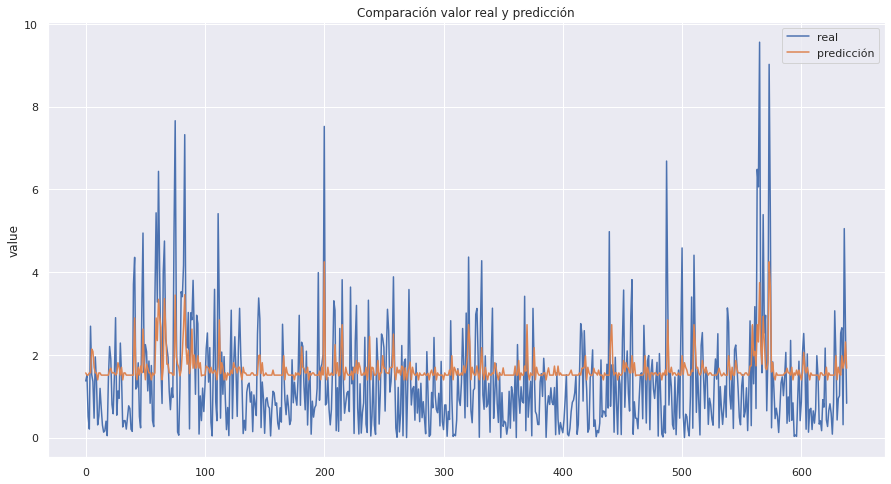

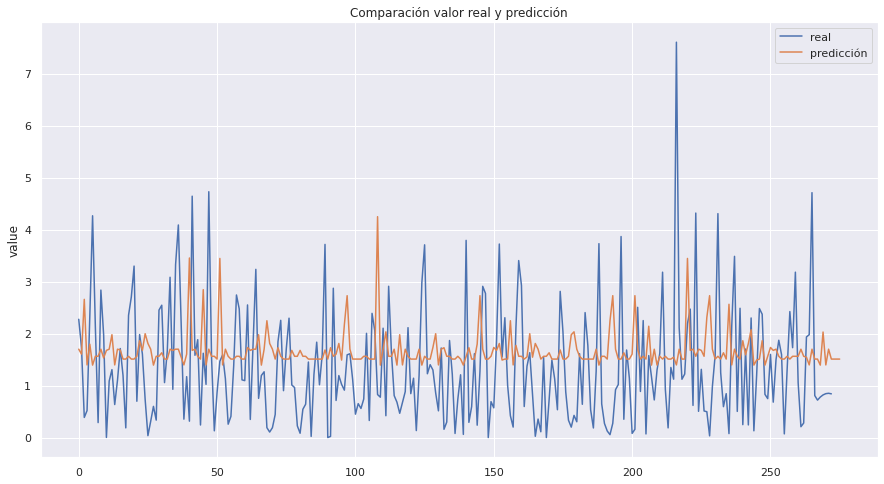

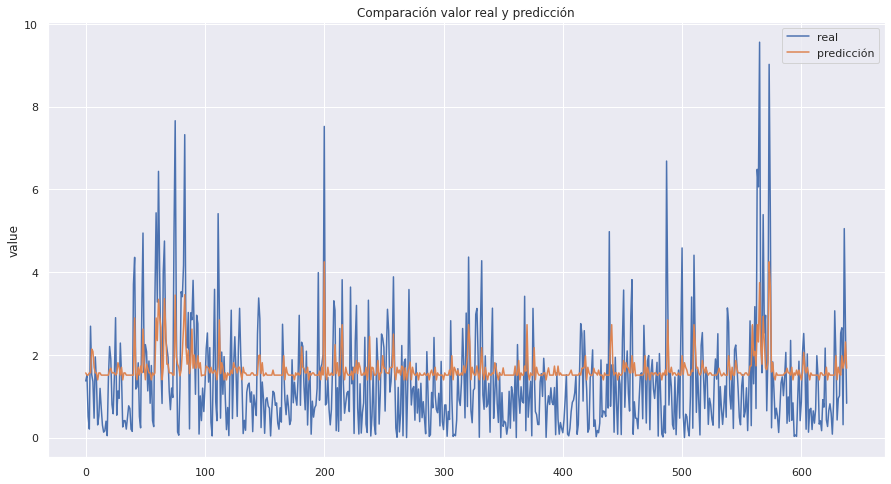

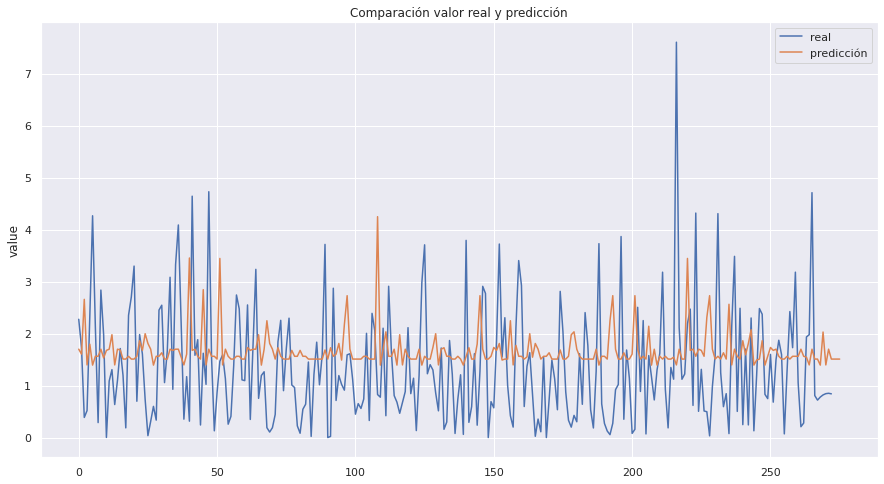

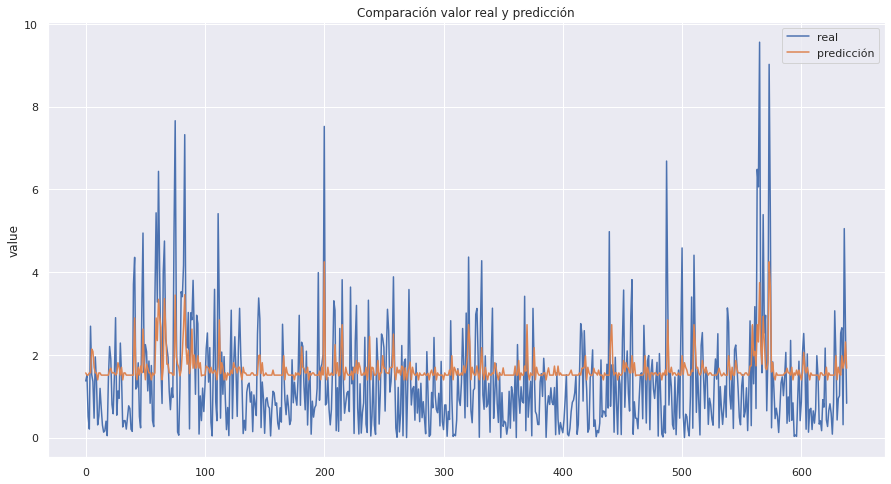

...

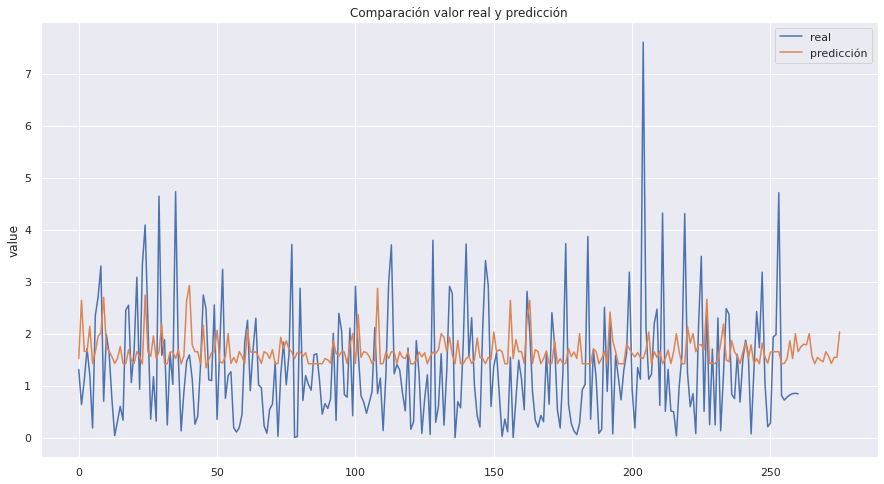

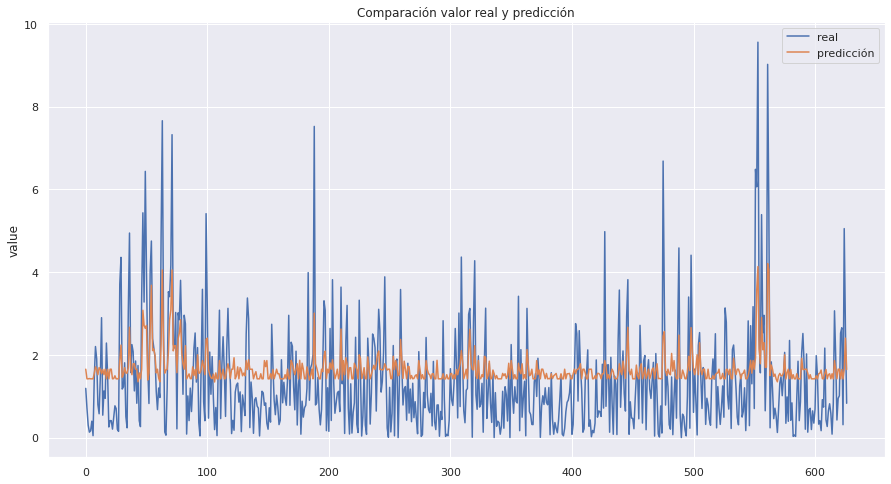

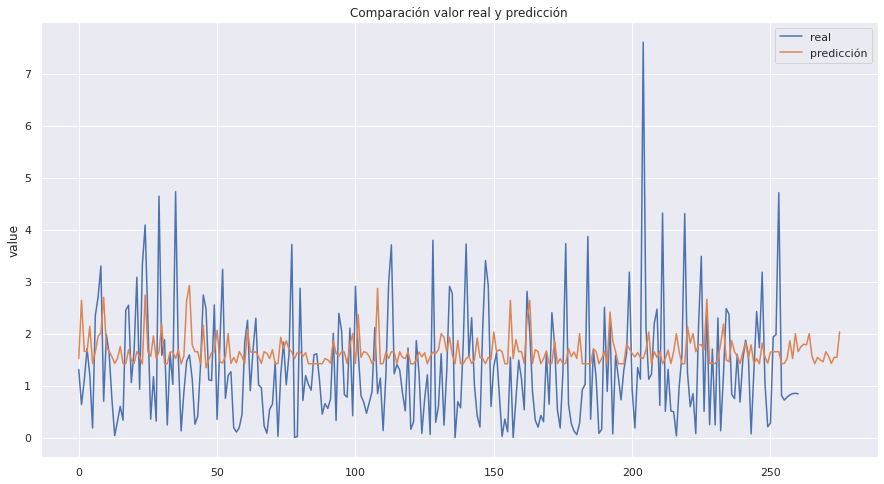

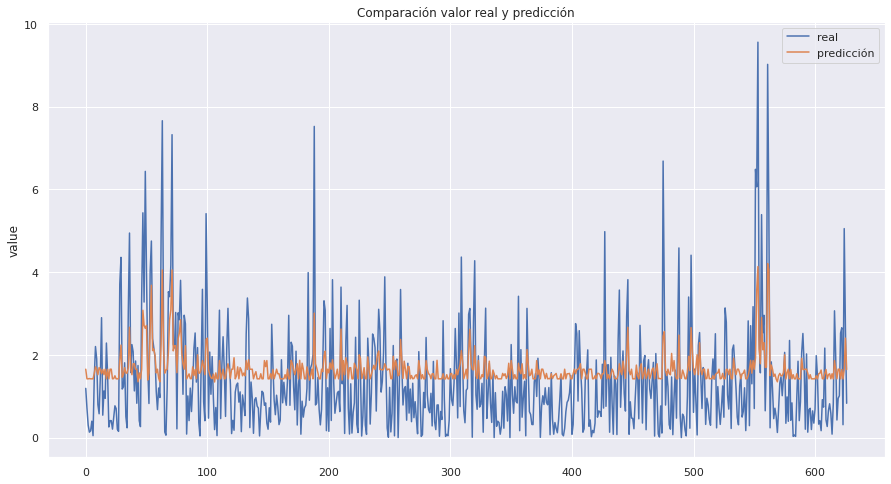

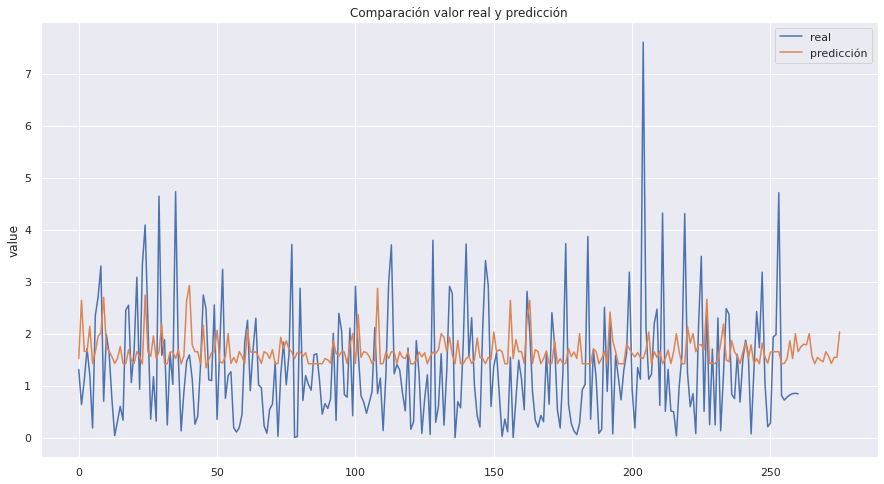

In [17]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)